In [1]:
%%capture
import scikits.samplerate
import sklearn
import os
import site
site.addsitedir('/home/schirrmr/.local/lib/python2.7/site-packages/')
site.addsitedir('/usr/lib/pymodules/python2.7/')
os.sys.path.insert(0, '/home/schirrmr/braindecode/code/')
%cd /home/schirrmr/braindecode/code/braindecode/
assert 'THEANO_FLAGS' in os.environ
# switch to cpu
os.environ['THEANO_FLAGS'] = 'floatX=float32,device=cpu,nvcc.fastmath=True'
%load_ext autoreload
%autoreload 2
import logging
import theano.tensor as T
import lasagne
import logging
log = logging.getLogger()
log.setLevel("DEBUG")
import matplotlib
from matplotlib import pyplot as plt
from matplotlib import cm
%matplotlib inline
%config InlineBackend.figure_format = 'png' 

import matplotlib.lines as mlines
import seaborn
seaborn.set_style('darkgrid')
matplotlib.rcParams['figure.figsize'] = (16.0, 1.0)
matplotlib.rcParams['font.size'] = 7
from braindecode.scripts.print_results import ResultPrinter
import theano
import scipy.signal
import numpy as np
from braindecode.veganlasagne.layer_util import print_layers
from braindecode.results.results import ResultPool

In [2]:
from braindecode.mywyrm.plot import ax_scalp
from braindecode.analysis.plot_util import plot_chan_matrices
def show_freq_profile(meaned_corrs, vmin=None, vmax=None):
    show_only_freq_profile(meaned_corrs)
    show_freq_sensor_topo(meaned_corrs, vmin=vmin, vmax=vmax)
    
def show_only_freq_profile(meaned_corrs, demean=False):
    plt.figure()
    profile_all = np.mean(meaned_corrs, axis=(0))
    if demean:
        profile_all -= np.mean(profile_all)
    plt.plot(profile_all)
    profile_C = np.mean(meaned_corrs[i_sensors_with_c], axis=(0))
    if demean:
        profile_C -= np.mean(profile_C)
    plt.plot(profile_C)
    plt.xticks(range(len(filterbands)), np.mean(filterbands, axis=1))
    plt.axhline(y=0, color='black', linestyle='dashed')
    plt.xlabel('Frequencies')
    plt.xlabel('Mean Absolute Correlation')
    plt.legend(("All sensors", "C sensors"))
    
   
    
def show_freq_sensor_topo(meaned_corrs, vmin=None, vmax=None):
    
    vmin = vmin or -2*np.mean(np.abs(meaned_corrs))
    vmax = vmax or 2*np.mean(np.abs(meaned_corrs))
    fig = plot_chan_matrices(meaned_corrs[:,:,np.newaxis],
                        sensor_names, sensor_map=sensor_map,
                  colormap=cm.coolwarm,  figsize=(12,10), 
                             vmin=vmin,
                             vmax=vmax)
    plt.yticks([])
    plt.tight_layout()
    fig.suptitle('Sensors and Frequencies (freqs on x-axis)',y=1.03, fontsize=18)

    
    
def show_sensor_topo(meaned_corrs, vmin=None, vmax=None):
    show_only_sensor_topo(meaned_corrs, vmin=vmin, vmax=vmax)
    show_sensor_scalp(meaned_corrs, vmin=vmin, vmax=vmax)

def show_only_sensor_topo(meaned_corrs, vmin=None, vmax=None):
    meaned_per_sensor = np.mean(meaned_corrs, axis=1)[:,np.newaxis, np.newaxis]
    vmin = vmin or -2*np.mean(np.abs(meaned_per_sensor))
    vmax = vmax or 2*np.mean(np.abs(meaned_per_sensor))
    fig = plot_chan_matrices(meaned_per_sensor,
                            sensor_names, sensor_map=sensor_map,
                      colormap=cm.coolwarm,  figsize=(12,10), 
                             vmin=vmin,
                             vmax=vmax)
    plt.yticks([])
    plt.tight_layout()

def show_sensor_scalp(meaned_corrs, vmin=None, vmax=None, figsize=(7,7)):
    meaned_per_sensor = np.mean(meaned_corrs, axis=1)[:,np.newaxis, np.newaxis]
    vmin = vmin or -2*np.mean(np.abs(meaned_per_sensor))
    vmax = vmax or 2*np.mean(np.abs(meaned_per_sensor))
    plt.figure(figsize=figsize)
    ax_scalp(meaned_per_sensor.squeeze(),sensor_names, colormap=cm.coolwarm, vmin=vmin,
            vmax=vmax)
    plt.yticks([])
    plt.tight_layout()
    
def load_topo_corrs(folder, params, i_layer):
    result_pool = ResultPool()
    result_pool.load_results(folder, params=params)
    result_file_names = result_pool.result_file_names()
    results = result_pool.result_objects()
    # sort by dataset filename
    sort_order = np.argsort([r.parameters['dataset_filename'] for r in results])

    result_file_names = np.array(result_file_names)[sort_order]
    results = np.array(results)[sort_order]

    unclean_sets = ['AnWe', 'OlIl', 'SvMu']
    topo_corrs_per_person = []
    rand_corrs_per_person = []
    clean_mask = []
    for file_name, result in zip(result_file_names, results):
        env_corr_filename = file_name.replace('.result.pkl', '.env_corrs.{:d}.npy'.format(i_layer))
        rand_corr_filename = file_name.replace('.result.pkl', '.env_rand_corrs.{:d}.npy'.format(i_layer))

        assert os.path.isfile(env_corr_filename)
        topo_corrs = np.load(env_corr_filename)
        rand_corrs = np.load(rand_corr_filename)
        if any(s in result.parameters['dataset_filename'] for s in unclean_sets):
            clean_mask.append(False)
        else:
            clean_mask.append(True)
        topo_corrs_per_person.append(topo_corrs)
        rand_corrs_per_person.append(rand_corrs)


    rand_corrs_per_person = np.array(rand_corrs_per_person)
    topo_corrs_per_person = np.array(topo_corrs_per_person)
    clean_mask = np.array(clean_mask)
    return topo_corrs_per_person, rand_corrs_per_person, clean_mask

def load_topo_class_corrs(folder, params):
    result_pool = ResultPool()
    result_pool.load_results(folder, params=params)
    result_file_names = result_pool.result_file_names()
    results = result_pool.result_objects()
    # sort by dataset filename
    sort_order = np.argsort([r.parameters['dataset_filename'] for r in results])

    result_file_names = np.array(result_file_names)[sort_order]
    results = np.array(results)[sort_order]

    unclean_sets = ['AnWe', 'OlIl', 'SvMu']
    topo_corrs_per_person = []
    clean_mask = []
    for file_name, result in zip(result_file_names, results):
        env_corr_filename = file_name.replace('.result.pkl', '.env_corrs.class.npy')
        if not os.path.isfile(env_corr_filename): continue
        assert os.path.isfile(env_corr_filename)
        topo_corrs = np.load(env_corr_filename)
        if any(s in result.parameters['dataset_filename'] for s in unclean_sets):
            clean_mask.append(False)
        else:
            clean_mask.append(True)
        topo_corrs_per_person.append(topo_corrs)


    topo_corrs_per_person = np.array(topo_corrs_per_person)
    clean_mask = np.array(clean_mask)
    return topo_corrs_per_person, clean_mask
    


def load_topo_corrs_for_layers(folder, params, i_all_layers):
    topo_corrs_by_layer = []
    rand_corrs_by_layer= []
    for i_layer in i_all_layers:
        topo_corrs, rand_corrs, clean_mask = load_topo_corrs(folder,
                   params, i_layer)
        topo_corrs_by_layer.append(topo_corrs)
        rand_corrs_by_layer.append(rand_corrs)
    return topo_corrs_by_layer, rand_corrs_by_layer, clean_mask

def plot_all_persons(corrs_per_person, rand_corrs_per_person, result_objects):
    for topo_corrs, rand_corrs, result  in zip(corrs_per_person,
                                           rand_corrs_per_person,
                                              result_objects):
        person = result.parameters['dataset_filename'].split('/')[-1][:4]
        log.info("{:s}".format(person))
        # 3rd filterband is 7-13
        sorted_units = np.argsort(topo_corrs[i_sensor][3])
        fig = plot_chan_matrices(topo_corrs[:,:,sorted_units].transpose(0,2,1),
                                sensor_names, sensor_map=sensor_map,
                          colormap=cm.coolwarm, figsize=(12,10), vmin=-0.5, vmax=0.5)
        fig.suptitle(person,y=1.025,fontsize=18)
        plt.yticks([])
        plt.tight_layout()

        rand_sorted_units = np.argsort(rand_corrs[i_sensor][3])
        fig = plot_chan_matrices(rand_corrs[:,:,rand_sorted_units].transpose(0,2,1),
                                sensor_names, sensor_map=sensor_map,
                          colormap=cm.coolwarm, figsize=(12,10),
                          vmin=-0.5, 
                          vmax=0.5)
        fig.suptitle(person + " (Untrained)", y=1.025,fontsize=18)
        plt.yticks([])
        plt.tight_layout()

In [3]:
from braindecode.datasets.generate_filterbank import generate_filterbank
filterbands = generate_filterbank(min_freq=1, max_freq=115,
        last_low_freq=31, low_width=6, low_overlap=3,
high_width=8, high_overlap=4)

def get_freq_inds(filterbands, low_freq, high_freq):
    i_low = np.where(filterbands[:,0] == low_freq)[0][0]
    i_high = np.where(filterbands[:,1] == high_freq)[0][0]
    return i_low, i_high

In [4]:
filterbands

array([[   0.2,    4. ],
       [   1. ,    7. ],
       [   4. ,   10. ],
       [   7. ,   13. ],
       [  10. ,   16. ],
       [  13. ,   19. ],
       [  16. ,   22. ],
       [  19. ,   25. ],
       [  22. ,   28. ],
       [  25. ,   31. ],
       [  28. ,   34. ],
       [  31. ,   39. ],
       [  35. ,   43. ],
       [  39. ,   47. ],
       [  43. ,   51. ],
       [  47. ,   55. ],
       [  51. ,   59. ],
       [  55. ,   63. ],
       [  59. ,   67. ],
       [  63. ,   71. ],
       [  67. ,   75. ],
       [  71. ,   79. ],
       [  75. ,   83. ],
       [  79. ,   87. ],
       [  83. ,   91. ],
       [  87. ,   95. ],
       [  91. ,   99. ],
       [  95. ,  103. ],
       [  99. ,  107. ],
       [ 103. ,  111. ],
       [ 107. ,  115. ],
       [ 111. ,  119. ]])

## Deep 5

In [5]:
ResultPrinter('data/models/paper/ours/cnt/deep4/car/').print_results(sets=True,
                                                                     params=dict(low_cut_off_hz='null', first_nonlin='$elu',
                                    double_time_convs=False,
                                    sensor_names='$all_EEG_sensors'))

Printing results in data/models/paper/ours/cnt/deep4/car/:

Terminal Table

id  filename  test_filename  time     test    test_sample  best    epoch  train    valid    
47  BhNo1-12  BhNo1-2        1:29:42  98.75%  95.65%       98.75%  171    99.67%   100.00%  
48  LuFi1-11  LuFi1-2        1:20:58  81.25%  78.09%       89.38%   64    99.75%   100.00%  
58  AnWe1-12  AnWe1-2        0:52:02  51.88%  46.69%       55.62%   41    91.12%   85.87%   
59  FaMa1-14  FaMa1-2        3:39:06  82.50%  78.55%       88.12%  446    99.43%   97.70%   
60  FrTh1-11  FrTh1-2        1:24:15  85.62%  81.67%       91.88%  153    99.66%   100.00%  
61  GuJo1-11  GuJo1-2        0:49:40  83.12%  77.48%       87.50%  105    100.00%  100.00%  
62  JoBe1-11  JoBe1-2        1:08:51  86.88%  79.13%       86.88%  115    99.89%   100.00%  
63  KaUs1-11  KaUs1-2        0:52:39  90.62%  86.91%       93.75%   49    99.89%   100.00%  
64  LaKa1-9   LaKa1-2        0:38:01  85.00%  82.86%       90.62%   52    99.85%   100.

In [6]:
from braindecode.datasets.sensor_positions import tight_C_positions, tight_cap_positions, get_EEG_sensors_sorted
sensor_names = np.array(get_EEG_sensors_sorted())
sensor_map = tight_cap_positions

i_sensor = np.where(sensor_names == 'FCC4h')[0][0]

i_sensors_with_c = np.array(['C' in name for name in sensor_names])

In [7]:
from braindecode.experiments.load import load_model
model = load_model('data/models/paper/ours/cnt/deep4/car/14')

/home/schirrmr/.local/lib/python2.7/site-packages/theano/tensor/signal/downsample.py:6: UserWarning: downsample module has been moved to the theano.tensor.signal.pool module.
  "downsample module has been moved to the theano.tensor.signal.pool module.")
INFO:braindecode.experiments.experiment:Setting n_sample preds automatically to 479
INFO:braindecode.experiments.experiment:Input window length is 522


In [8]:
from braindecode.veganlasagne.layer_util import print_layers

In [9]:
topo_corrs_by_layer, rand_corrs_by_layer, clean_mask = load_topo_corrs_for_layers(
    'data/models/paper/ours/cnt/deep4/car/',
               dict(low_cut_off_hz='null', first_nonlin='$elu',
                                    double_time_convs=False,
                                    sensor_names='$all_EEG_sensors'),
    (8,14,20,26))

### Mean across persons and units and filterbands

### diff and significance


In [10]:
from braindecode.analysis.stats import sign_test, wilcoxon_signed_rank
def diff_and_sign_test(topo_per_person, rand_per_person, method=sign_test):
    diff = np.mean(topo_per_person - rand_per_person, axis=0)
    p_vals = np.ones(topo_per_person.shape[1]) * np.nan
    for i_sensor in xrange(topo_per_person.shape[1]):
        p_vals[i_sensor] =  method(topo_per_person[:,i_sensor], rand_per_person[:,i_sensor])
    assert not np.any(np.isnan(p_vals))
    return diff, p_vals

In [12]:
from braindecode.mywyrm.plot import CHANNEL_10_20_APPROX, get_channelpos
def plot_diff_and_significance(diff, p_vals, significance_level=0.01, vmin=None, vmax=None,ax=None):
    if ax is None:
        plt.figure(figsize=(5,5))
    ax = ax_scalp(diff,sensor_names, colormap=cm.coolwarm, vmin=vmin, vmax=vmax, ax=ax)


    for i_sensor, name in enumerate(sensor_names):
        if p_vals[i_sensor] < significance_level:
            point = get_channelpos(name, CHANNEL_10_20_APPROX)
            ax.annotate('*', point, va='center', ha='center', fontsize=16)

## Correlation between envelope and class itself - not needed?

In [13]:
env_class_corrs, clean_mask = load_topo_class_corrs('data/models/paper/ours/cnt/deep4/car/',
               dict(low_cut_off_hz='null', first_nonlin='$elu',
                                    double_time_convs=False,
                                    sensor_names='$all_EEG_sensors'))

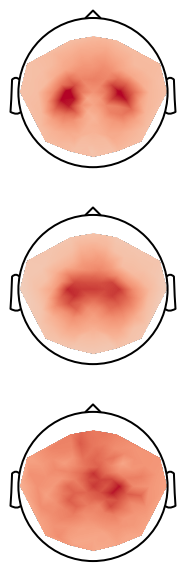

In [14]:
plt.figure(figsize=(5,10))
i_plot = 0
for low,high in ((7,16),(22,31), (67,83)):
    i_freq_low, i_freq_high = get_freq_inds(filterbands,low,high)
    ax = plt.subplot(3,1, i_plot+1)
    vmin = -0.2
    vmax = 0.2
    if low == 67:
        vmin = -0.06
        vmax = 0.06
    ax_scalp(np.mean(np.abs(env_class_corrs[:,:,i_freq_low:i_freq_high+1]), axis=(0,2,3)),
             sensor_names, colormap=cm.coolwarm, 
             vmin=vmin, vmax=vmax, ax=ax)
    i_plot += 1

## Correlations through layers

/usr/lib/pymodules/python2.7/matplotlib/collections.py:548: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if self._edgecolors == 'face':


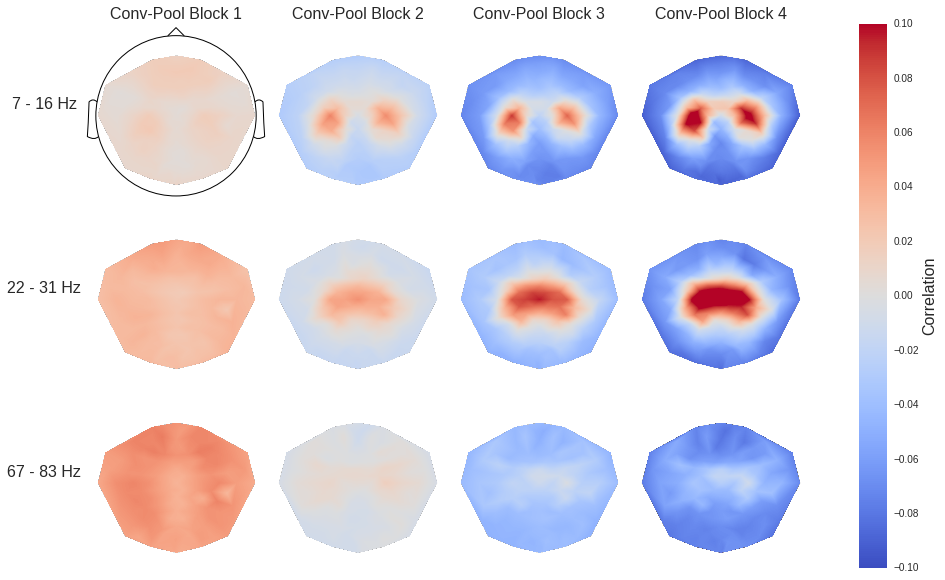

In [15]:
fig, axes = plt.subplots(nrows=3, ncols=4,figsize=(14,8))

i_freq = 0
for low,high in ((7,16),(22,31), (67,83)):
    i_freq_low, i_freq_high = get_freq_inds(filterbands,low,high)
    i_layer = 0
    for topo_corrs, rand_corrs in zip(topo_corrs_by_layer, rand_corrs_by_layer):
        scalp_line_style = 'solid'
        if i_freq == 0 and i_layer == 0:
            scalp_line_width = 1
        else:
            scalp_line_width=0
        ax = axes[i_freq][i_layer]
        if i_freq == 0:
            ax.set_title("Conv-Pool Block {:d}".format(i_layer+1), fontsize=16)
        if i_layer == 0:
            ax.set_ylabel("{:d} - {:d} Hz".format(low,high), rotation=0, fontsize=16, labelpad=40)
        topo_per_person = np.mean(np.abs(topo_corrs[clean_mask,:,i_freq_low:i_freq_high+1]), axis=(2,3))
        rand_per_person = np.mean(np.abs(rand_corrs[clean_mask,:,i_freq_low:i_freq_high+1]), axis=(2,3))
        diff, p_vals = diff_and_sign_test(topo_per_person, rand_per_person, method=sign_test)
        contour = ax_scalp(diff,sensor_names, colormap=cm.coolwarm, vmin=-0.1, vmax=0.1, ax=ax,
                scalp_line_width=scalp_line_width, scalp_line_style=scalp_line_style)
        i_layer += 1
    i_freq += 1

    

fig.tight_layout()
# out of ideas to make proper colorbar...
# just make a fakeplot
contour = ax_scalp(np.linspace(-0.1,0.1,len(sensor_names)),
                   sensor_names, colormap=cm.coolwarm, vmin=-0.1, vmax=0.1, ax=ax,
                scalp_line_width=scalp_line_width, scalp_line_style=scalp_line_style)
    
cbar = fig.colorbar(contour, ax=axes.ravel().tolist())
cbar.set_label('Correlation', fontsize=16)
ax_scalp(diff,sensor_names, colormap=cm.coolwarm, vmin=-0.1, vmax=0.1, ax=ax,
                scalp_line_width=scalp_line_width, scalp_line_style=scalp_line_style)

### Absolute without subtracting untrained model

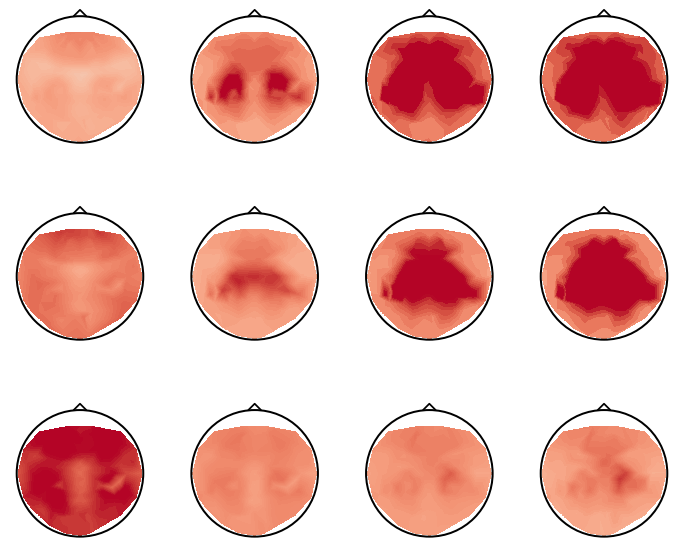

In [21]:
i_freq = 0
plt.figure(figsize=(12,10))
for low,high in ((7,16),(22,31), (67,83)):
    i_freq_low, i_freq_high = get_freq_inds(filterbands,low,high)
    i_layer = 0
    for topo_corrs, rand_corrs in zip(topo_corrs_by_layer, rand_corrs_by_layer):
        ax = plt.subplot(3,4, i_freq * 4 + 1 + i_layer)
        topo_per_person = np.mean(np.abs(topo_corrs[clean_mask,:,i_freq_low:i_freq_high+1]), axis=(2,3))
        ax_scalp(np.mean(topo_per_person, axis=0),sensor_names, colormap=cm.coolwarm, vmin=-0.1, vmax=0.1, ax=ax)
        i_layer += 1
    i_freq += 1
        


In [48]:
def load_patterns(folder):
    res_pool = ResultPool()
    res_pool.load_results(folder)

    result_file_names = res_pool.result_file_names()
    results = res_pool.result_objects()

    # sort by dataset filename
    sort_order = np.argsort([r.parameters['dataset_filename'] for r in results])

    result_file_names = np.array(result_file_names)[sort_order]
    results = np.array(results)[sort_order]

    # now sorted
    dataset_names = [r.parameters['dataset_filename'] for r in results]
    unclean_sets = ['AnWe', 'OlIl', 'SvMu']
    all_patterns = []
    clean_mask = []
    all_exps = []
    for file_name, dataset in zip(result_file_names, dataset_names):
        log.info("Loading for {:s}".format(dataset))
        model_file_name = file_name.replace('.result.pkl', '.pkl')
        csp_exp = np.load(model_file_name)
        patterns = csp_exp.binary_csp.patterns
        pattern_arr = np.ones((patterns.shape[0],
                           patterns.shape[1],
                           patterns.shape[2],
                           patterns[0,0,0].shape[0],
                           patterns[0,0,0].shape[1],)) * np.nan
        for a in xrange(pattern_arr.shape[0]):
            for b in xrange(pattern_arr.shape[1]):
                for c in xrange(pattern_arr.shape[2]):
                    pattern_arr[a,b,c] = patterns[a,b,c]

        pattern_arr = pattern_arr.squeeze()
        assert not np.any(np.isnan(pattern_arr))
        all_patterns.append(pattern_arr)
        all_exps.append(csp_exp)
        
        if any([s in dataset for s in unclean_sets]):
            clean_mask.append(False)
        else:
            clean_mask.append(True)

    all_patterns = np.array(all_patterns)
    clean_mask = np.array(clean_mask)
    return all_patterns, clean_mask, all_exps


In [49]:
folder = 'data/models/paper/ours/csp/car/'
all_patterns, clean_mask_csp, all_csps = load_patterns(folder)

INFO:root:Loading for data/BBCI-without-last-runs/AnWeMoSc1S001R01_ds10_1-12.BBCI.mat
INFO:root:Loading for data/BBCI-without-last-runs/BhNoMoSc1S001R01_ds10_1-12.BBCI.mat
INFO:root:Loading for data/BBCI-without-last-runs/FaMaMoSc1S001R01_ds10_1-14.BBCI.mat
INFO:root:Loading for data/BBCI-without-last-runs/FrThMoSc1S001R01_ds10_1-11.BBCI.mat
INFO:root:Loading for data/BBCI-without-last-runs/GuJoMoSc01S001R01_ds10_1-11.BBCI.mat
INFO:root:Loading for data/BBCI-without-last-runs/JoBeMoSc01S001R01_ds10_1-11.BBCI.mat
INFO:root:Loading for data/BBCI-without-last-runs/KaUsMoSc1S001R01_ds10_1-11.BBCI.mat
INFO:root:Loading for data/BBCI-without-last-runs/LaKaMoSc1S001R01_ds10_1-9.BBCI.mat
INFO:root:Loading for data/BBCI-without-last-runs/LuFiMoSc3S001R01_ds10_1-11.BBCI.mat
INFO:root:Loading for data/BBCI-without-last-runs/MaGlMoSc2S001R01_ds10_1-12.BBCI.mat
INFO:root:Loading for data/BBCI-without-last-runs/MaJaMoSc1S001R01_ds10_1-11.BBCI.mat
INFO:root:Loading for data/BBCI-without-last-runs/MaK

In [58]:
wanted_patterns = all_patterns[7,3,:,:][:,:,np.array([0,1,2,7,8,9])]

### Individual persons

In [21]:
from braindecode.results.results import sort_results_by_filename

In [26]:
topo_corrs_per_person.shape

(20, 128, 32, 200)

In [37]:
filterbands[14]

array([ 43.,  51.])

In [32]:
filterbands[18]

array([ 59.,  67.])

In [33]:
filterbands[25]

array([ 87.,  95.])

In [61]:
per_sub_diff

array([ 0.0111234 ,  0.08985709,  0.00567503,  0.01078805,  0.01264924,
        0.00460698,  0.03904258,  0.00591997,  0.00792925,  0.00309931,
        0.01490808,  0.12169021,  0.00888128,  0.0104624 ,  0.00750727,
        0.01000362,  0.08949409,  0.09777771,  0.00814677,  0.01342754])

In [74]:
gamma_corrs = topo_corrs_per_person[:,:,19:24,:]
pre_gamma_corrs = topo_corrs_per_person[:,:,15:18,:]
post_gamma_corrs = topo_corrs_per_person[:,:,25:,:]

gamma_corrs = np.median(np.abs(gamma_corrs), axis=(2,3))
pre_gamma_corrs = np.median(np.abs(pre_gamma_corrs), axis=(2,3))
post_gamma_corrs = np.median(np.abs(post_gamma_corrs), axis=(2,3))
diff = gamma_corrs - np.maximum(pre_gamma_corrs, post_gamma_corrs)
per_sub_diff = np.median(np.sort(diff, axis=1)[:,-3:], 
                       axis=1)


print sensor_names[np.argsort(diff[2])[::-1]]
person_names = [r.parameters['dataset_filename'].split('/')[-1][:4] for r in sorted_result_objects]
print np.argsort(per_sub_diff)[::-1] + 1
np.sort(person_names)[np.argsort(per_sub_diff)[::-1]]

print zip(np.argsort(per_sub_diff)[::-1] + 1, np.sort(person_names)[np.argsort(per_sub_diff)[::-1]])

['CCP6h' 'F1' 'CP3' 'TTP7h' 'AFF1' 'FFC1h' 'AFF2' 'FC1' 'CCP3h' 'CP5' 'P3'
 'FCz' 'CPP3h' 'T8' 'POO3h' 'CPP5h' 'C3' 'C4' 'FCC1h' 'F2' 'F5' 'M1' 'Oz'
 'FFC2h' 'TTP8h' 'FFC3h' 'CCP5h' 'PPO1' 'CPP6h' 'F3' 'POO4h' 'CCP4h' 'P8'
 'Fz' 'PPO5h' 'OI1h' 'FFC4h' 'FCC4h' 'FCC3h' 'CP1' 'O1' 'P6' 'FC2' 'P1'
 'POz' 'TPP9h' 'TPP7h' 'PO3' 'F6' 'PO7' 'TPP8h' 'P5' 'I1' 'C2' 'PO10' 'PO9'
 'P10' 'FT10' 'PPO2' 'M2' 'FCC5h' 'FC3' 'CPP4h' 'FC4' 'I2' 'PPO6h' 'CPP1h'
 'CP6' 'AFz' 'POO9h' 'FCC2h' 'C1' 'PO6' 'OI2h' 'PO8' 'O2' 'AFp3h' 'Pz'
 'AFF5h' 'Iz' 'FTT9h' 'TPP10h' 'FFC5h' 'AF3' 'PO4' 'PO5' 'AF4' 'P7' 'F8'
 'C6' 'POO10h' 'AFF6h' 'FFC6h' 'PPO10h' 'P9' 'F4' 'FC6' 'FCC6h' 'AFp4h'
 'TP8' 'AF7' 'TP7' 'P4' 'FC5' 'CPP2h' 'F7' 'PPO9h' 'Cz' 'P2' 'FTT10h' 'AF8'
 'FT9' 'FFT8h' 'CCP1h' 'FTT8h' 'FFT7h' 'CP2' 'CCP2h' 'Fpz' 'CP4' 'FT8' 'T7'
 'Fp1' 'CPz' 'Fp2' 'C5' 'FTT7h' 'FT7']
[12 18  2 17  7 11 20  5  1  4 14 16 13 19  9 15  8  3  6 10]
[(12, 'MaKi'), (18, 'RoSc'), (2, 'BhNo'), (17, 'RoBe'), (7, 'KaUs'), (11, 'MaJa'), (2

INFO:root:AnWe
INFO:root:BhNo
INFO:root:FaMa
INFO:root:FrTh
INFO:root:GuJo
INFO:root:JoBe
INFO:root:KaUs
INFO:root:LaKa
INFO:root:LuFi
INFO:root:MaGl
INFO:root:MaJa
INFO:root:MaKi
INFO:root:MaVo
INFO:root:NaMa
INFO:root:OlIl
INFO:root:PiWi
INFO:root:RoBe
INFO:root:RoSc
INFO:root:StHe
INFO:root:SvMu


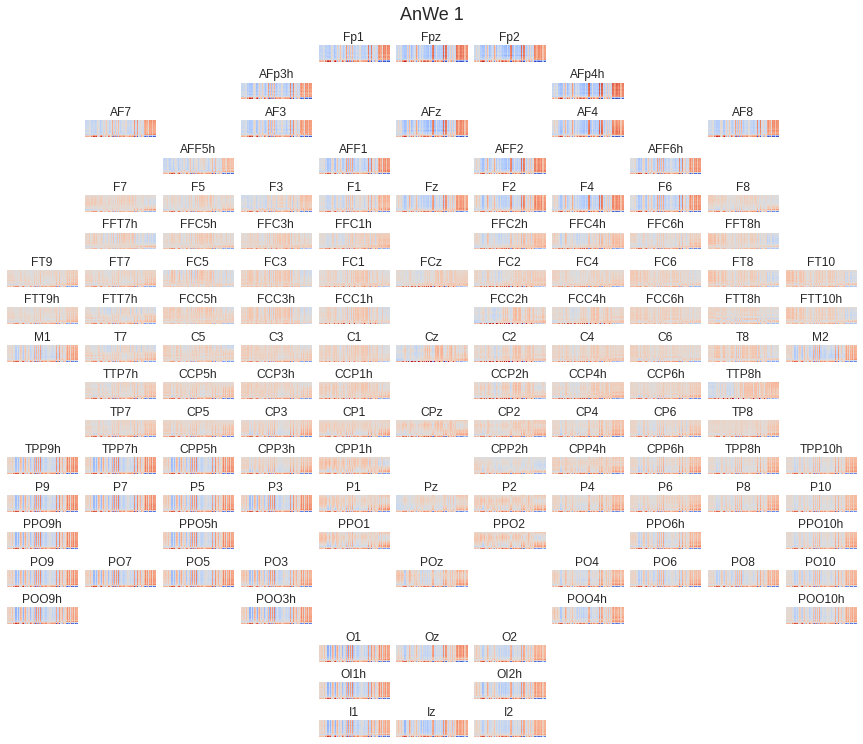

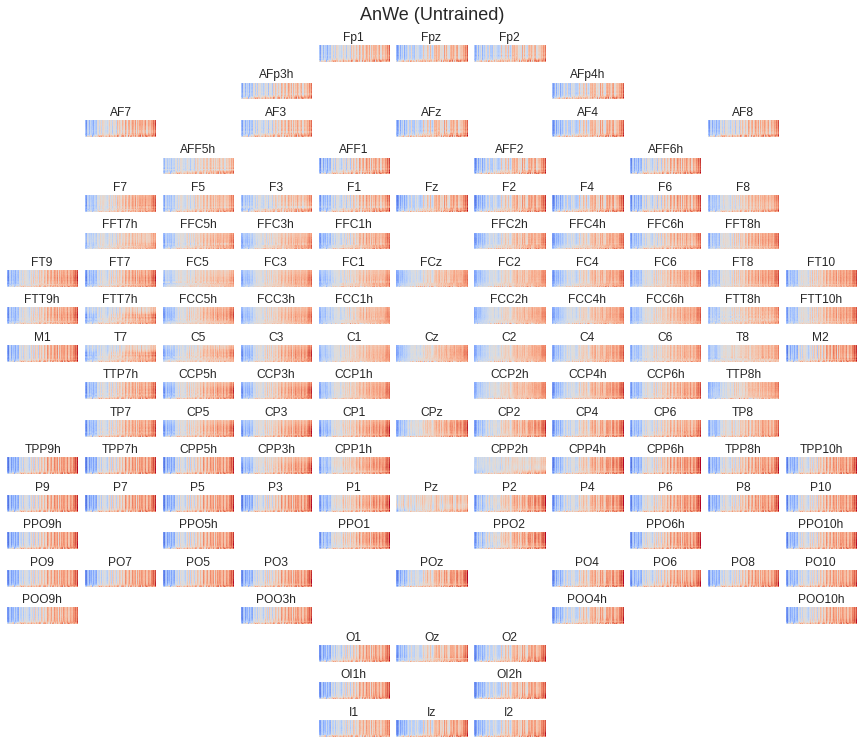

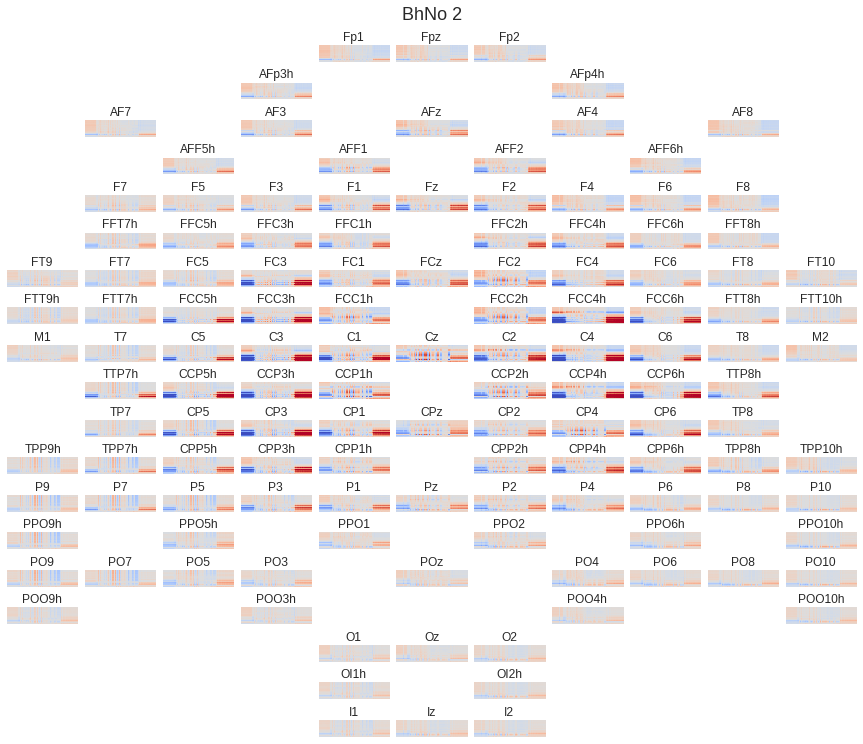

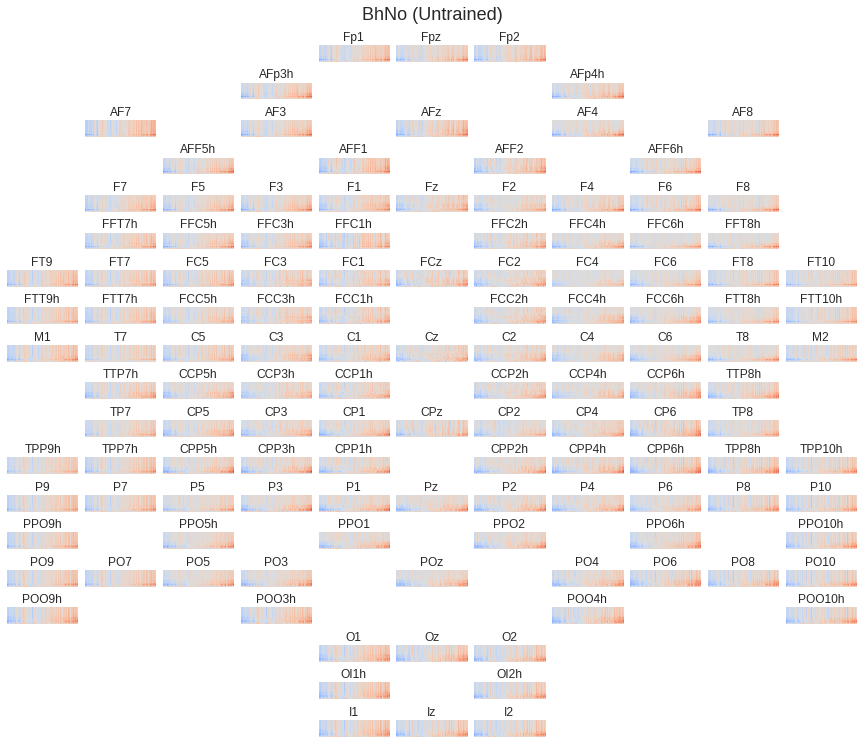

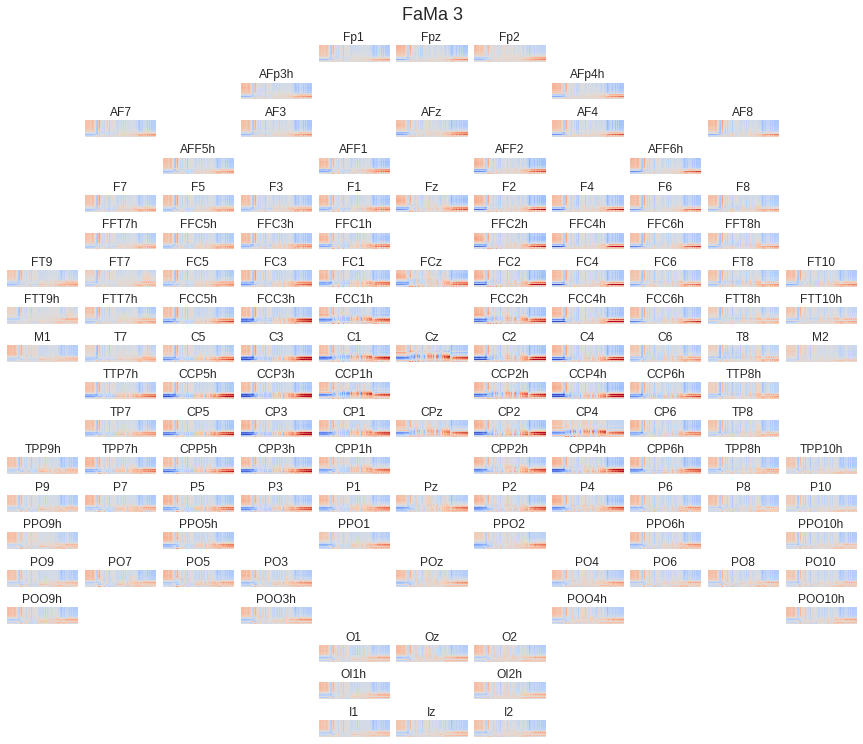

...

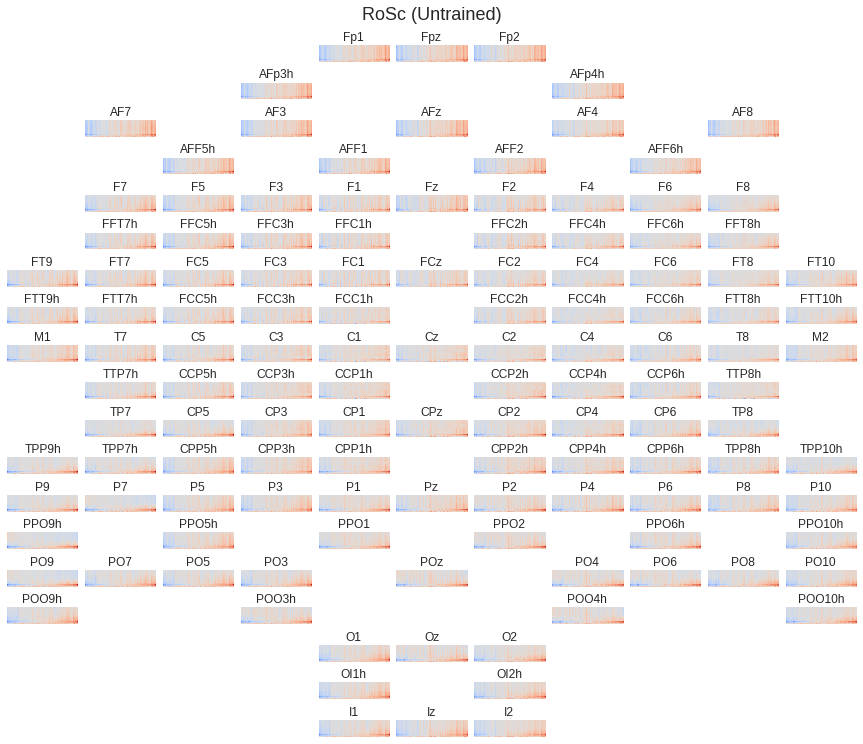

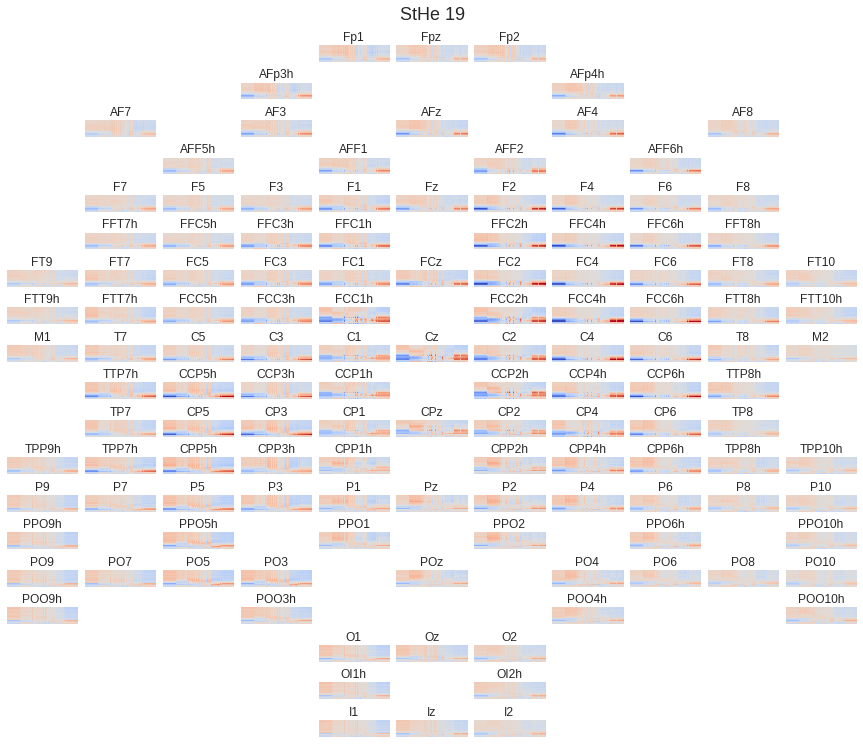

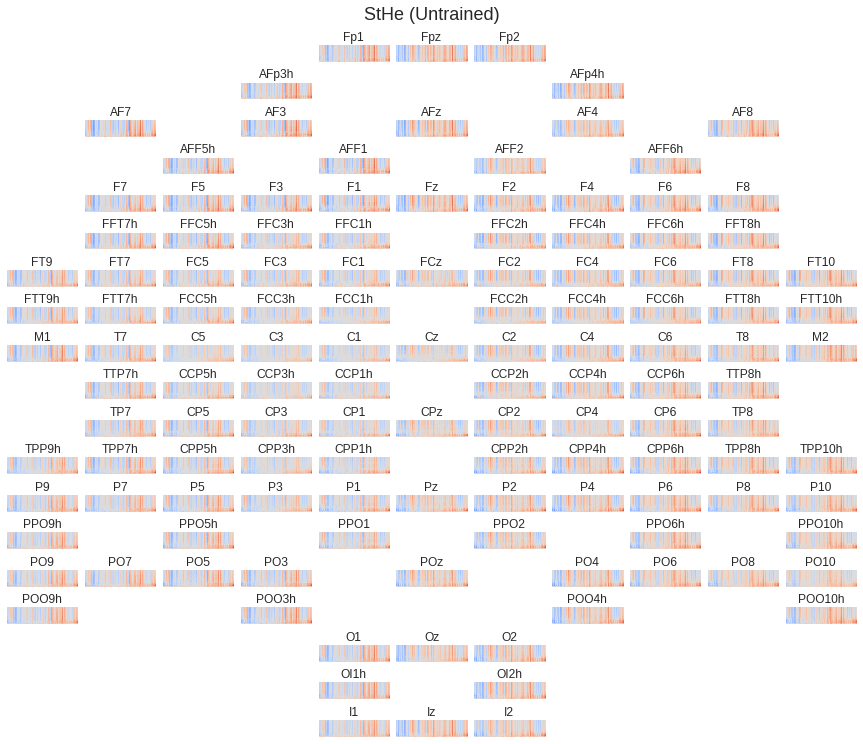

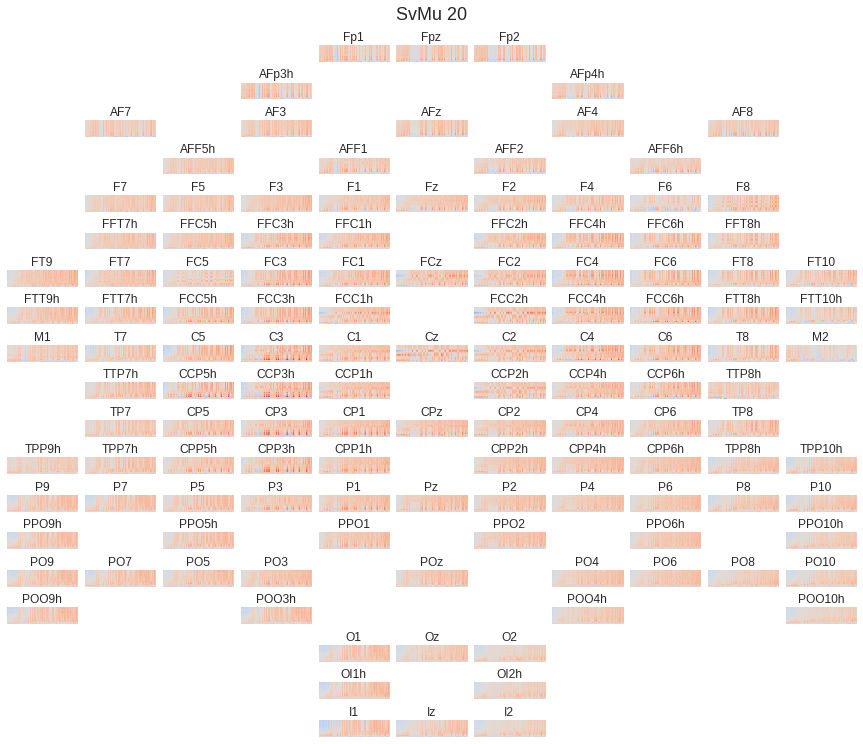

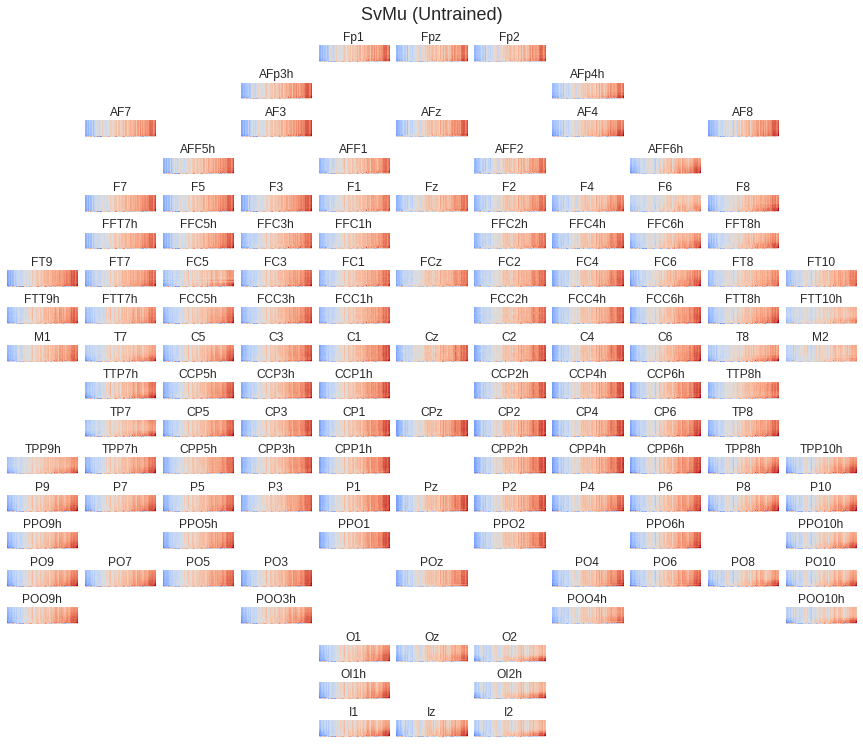

In [25]:
#"""
topo_corrs_per_person = topo_corrs_by_layer[-1]
rand_corrs_per_person = rand_corrs_by_layer[-1]
result_pool = ResultPool()
result_pool.load_results('data/models/paper/ours/cnt/deep4/car/', start=40,
                         params=dict(low_cut_off_hz='null', first_nonlin='$elu',
                                    double_time_convs=False,
                                    sensor_names='$all_EEG_sensors'))

sorted_result_objects = sort_results_by_filename(result_pool.result_objects())
for i_subject, (topo_corrs, rand_corrs, result)  in enumerate(zip(topo_corrs_per_person,
                                           rand_corrs_per_person,
                                          sorted_result_objects)):
    person = result.parameters['dataset_filename'].split('/')[-1][:4]
    log.info("{:s}".format(person))
    # 3rd filterband is 7-13
    sorted_units = np.argsort(topo_corrs[i_sensor][3])
    fig = plot_chan_matrices(topo_corrs[:,:,sorted_units].transpose(0,2,1),
                            sensor_names, sensor_map=sensor_map,
                      colormap=cm.coolwarm, figsize=(12,10), vmin=-0.5, vmax=0.5)
    fig.suptitle(person + " {:d}".format(i_subject+1),y=1.025,fontsize=18)
    plt.yticks([])
    plt.tight_layout()
    
    rand_sorted_units = np.argsort(rand_corrs[i_sensor][3])
    fig = plot_chan_matrices(rand_corrs[:,:,rand_sorted_units].transpose(0,2,1),
                            sensor_names, sensor_map=sensor_map,
                      colormap=cm.coolwarm, figsize=(12,10),
                      vmin=-0.5, 
                      vmax=0.5)
    fig.suptitle(person + " (Untrained)", y=1.025,fontsize=18)
    plt.yticks([])
    plt.tight_layout()
#"""
None

## Shallow

In [112]:
ResultPrinter('data/models/paper/ours/cnt/shallow/car/').print_results(
                         params=dict(low_cut_off_hz='null',
                                    sensor_names='$all_EEG_sensors'))



Printing results in data/models/paper/ours/cnt/shallow/car/:


Dataset-Averaged Results:

Terminal Table

id  files  time     std      test_sample  std    test    std    train_sample  std    train   std    valid_sample  std    valid   std    
0   20     0:46:51  0:20:01  80.48%       8.69%  85.75%  7.57%  98.16%        2.15%  99.32%  0.93%  97.27%        3.74%  99.26%  1.89%  


In [146]:
result_pool = ResultPool()

result_pool.load_results('data/models/paper/ours/cnt/shallow/car/',
                         params=dict(low_cut_off_hz='null',
                                    sensor_names='$all_EEG_sensors'))

res_file_names = result_pool.result_file_names()

In [147]:
unclean_sets = ['AnWe', 'OlIl', 'SvMu']

topo_corrs_per_person = []
rand_corrs_per_person = []
clean_mask = []
for file_name, result in zip(res_file_names, result_pool.result_objects())[:9]:
    env_corr_filename = file_name.replace('.result.pkl', '.env_corrs.5.npy')
    rand_corr_filename = file_name.replace('.result.pkl', '.env_rand_corrs.5.npy')
    
    assert os.path.isfile(env_corr_filename)
    topo_corrs = np.load(env_corr_filename)
    rand_corrs = np.load(rand_corr_filename)
    if any(s in result.parameters['dataset_filename'] for s in unclean_sets):
        clean_mask.append(False)
    else:
        clean_mask.append(True)
    topo_corrs_per_person.append(topo_corrs)
    rand_corrs_per_person.append(rand_corrs)
    
rand_corrs_per_person = np.array(rand_corrs_per_person)
topo_corrs_per_person = np.array(topo_corrs_per_person)
clean_mask = np.array(clean_mask)

# meaning over units and persons
meaned_abs_corrs = np.mean(np.abs(topo_corrs_per_person[clean_mask]), axis=(0,3))

In [86]:

meaned_min_corrs = np.mean(np.min(topo_corrs_per_person[clean_mask], axis=3), axis=(0))
meaned_min_max_corrs = np.mean(np.max(topo_corrs_per_person[clean_mask], axis=3) -
                               np.min(topo_corrs_per_person[clean_mask], axis=3), axis=(0,))

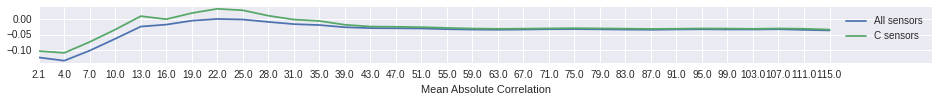

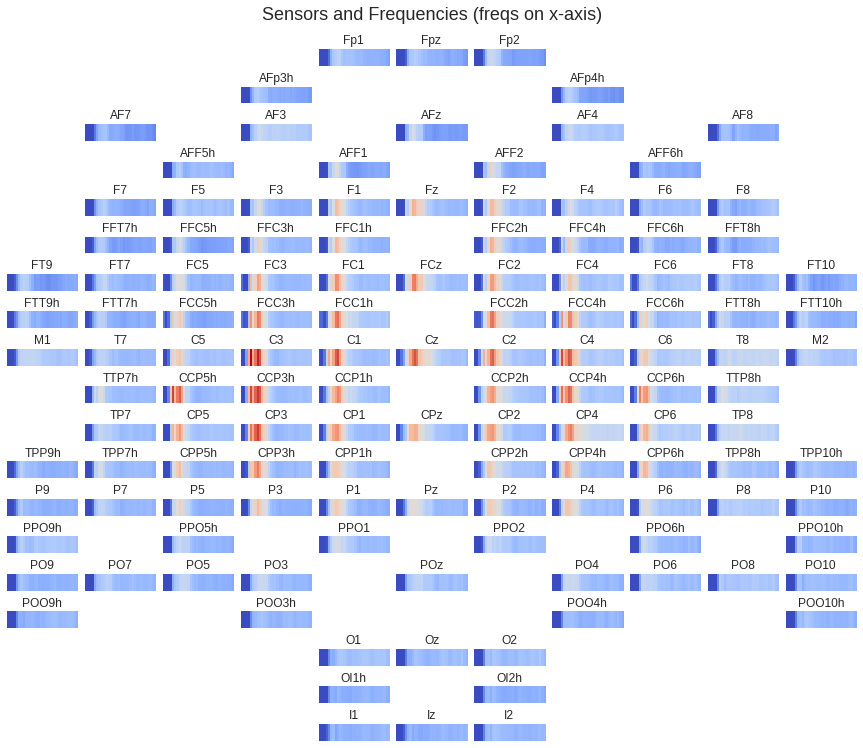

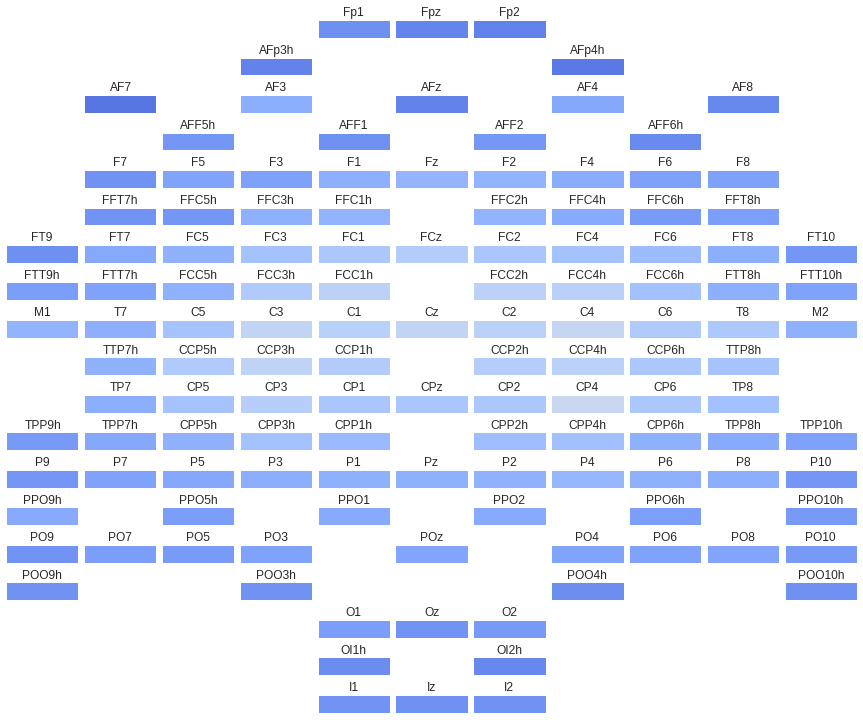

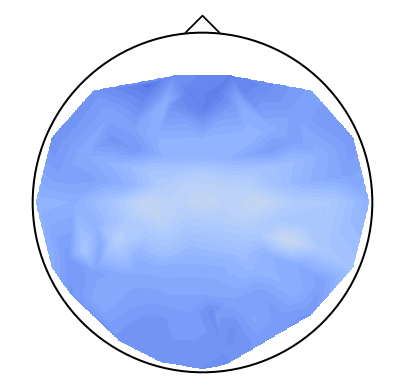

In [151]:
show_freq_profile(meaned_abs_corrs - np.mean(np.abs(rand_corrs_per_person[clean_mask]), axis=(0,3)))
show_sensor_topo(meaned_abs_corrs - np.mean(np.abs(rand_corrs_per_person[clean_mask]), axis=(0,3)))

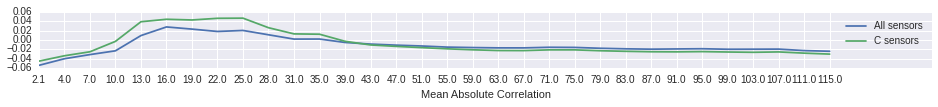

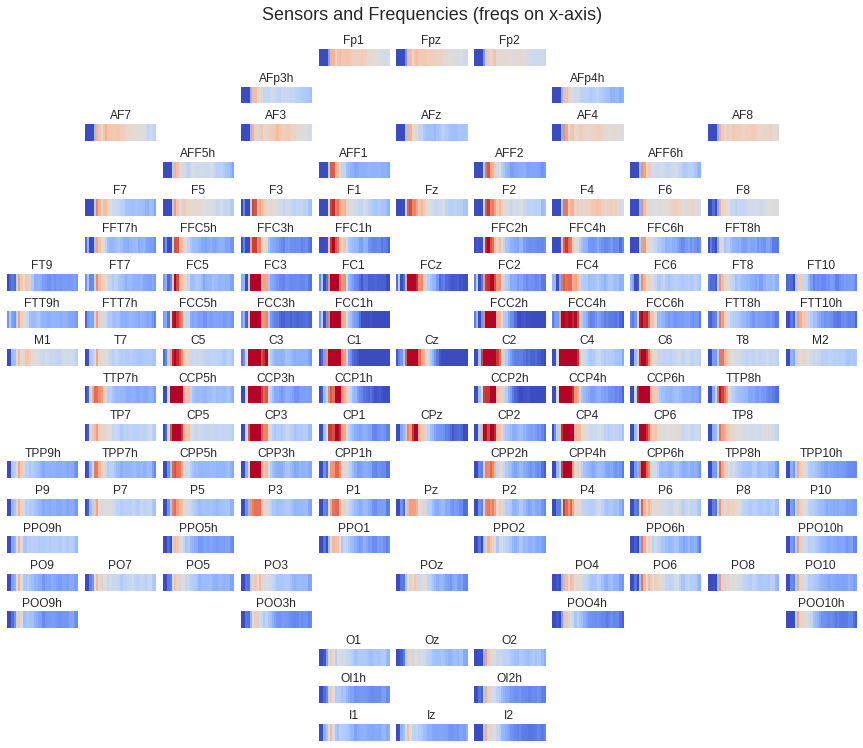

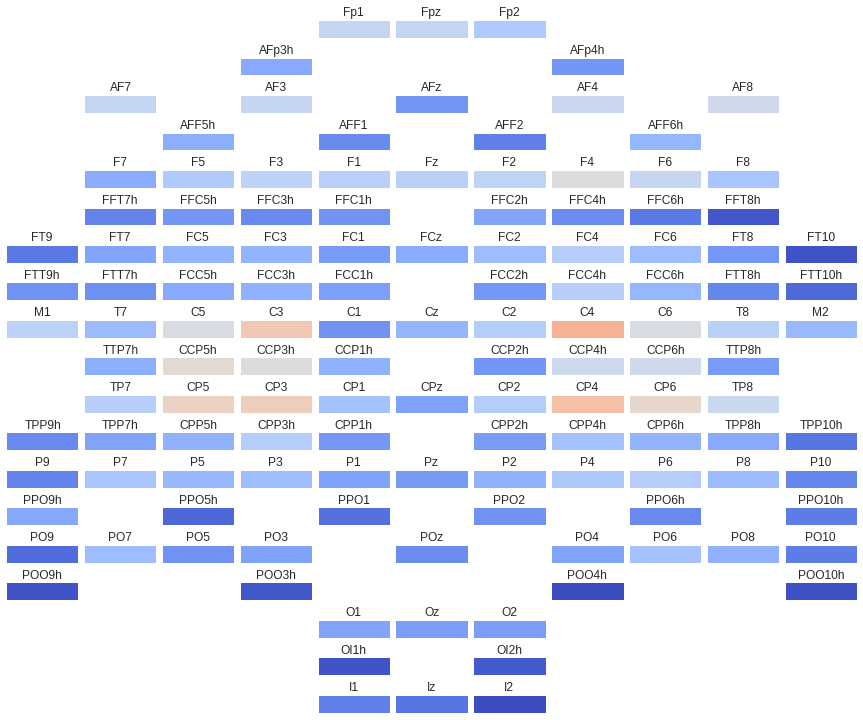

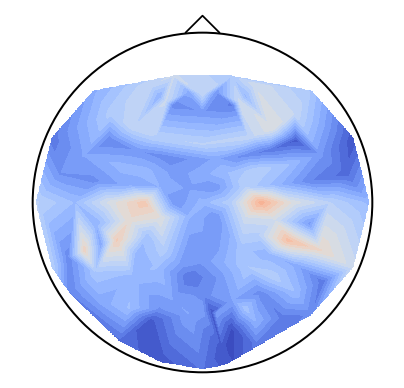

In [157]:
meaned_std_corrs = np.std(topo_corrs_per_person[clean_mask], axis=(0,3))
meaned_rand_std_corrs = np.std(rand_corrs_per_person[clean_mask], axis=(0,3))
show_freq_profile(meaned_std_corrs - meaned_rand_std_corrs)
show_sensor_topo(meaned_std_corrs - meaned_rand_std_corrs)

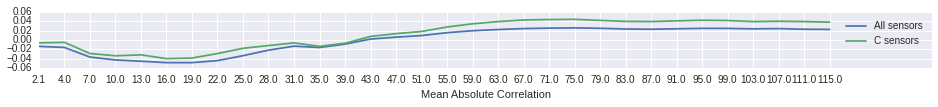

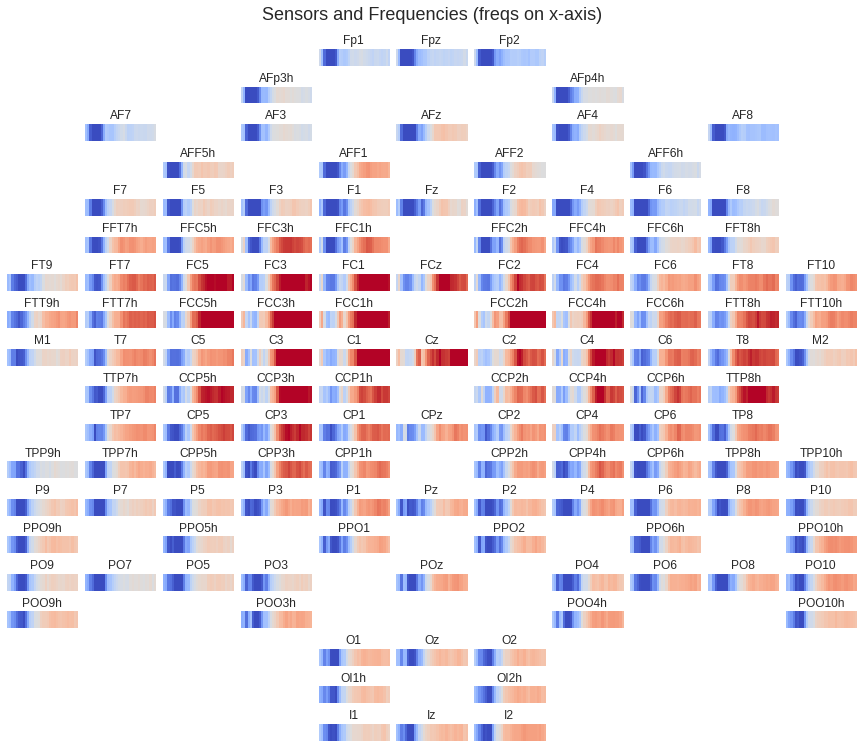

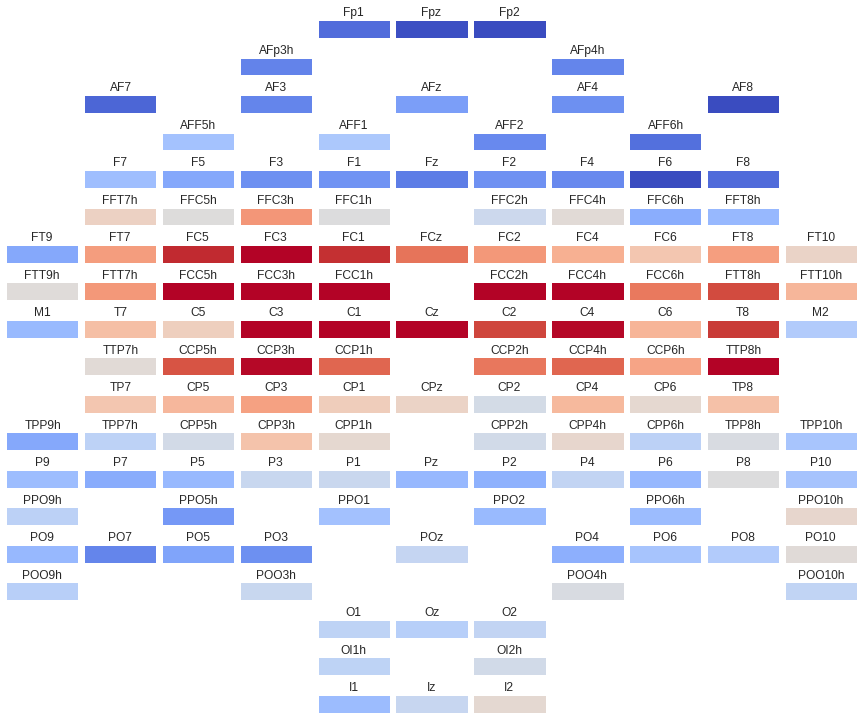

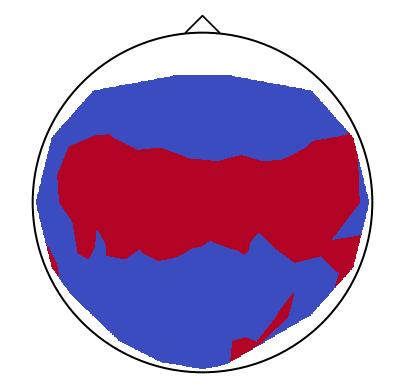

In [114]:
show_freq_profile(-meaned_min_corrs)
show_sensor_topo(-meaned_min_corrs)


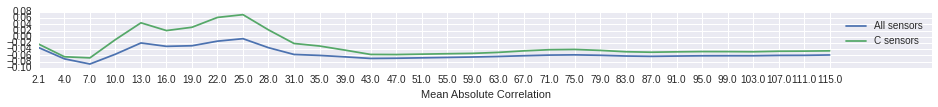

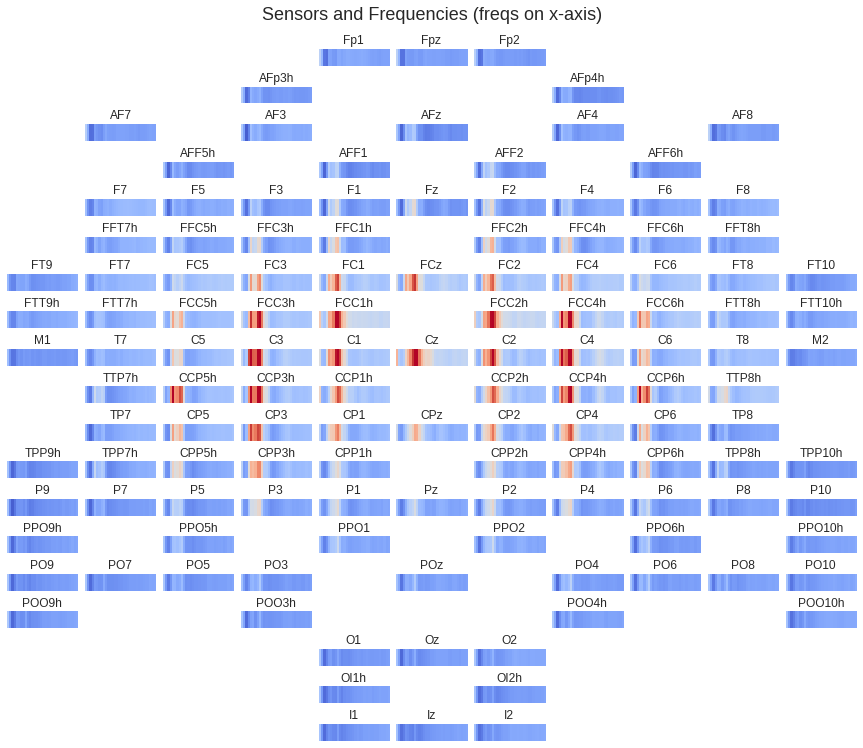

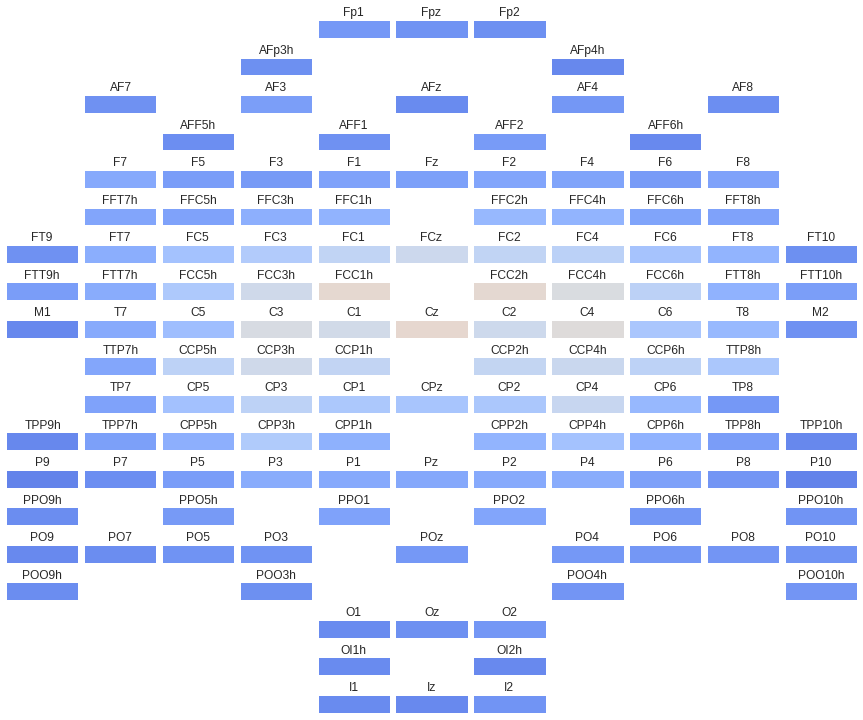

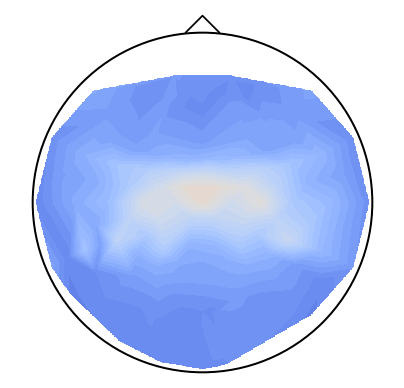

In [133]:
meaned_rand_corrs = np.mean(np.abs(rand_corrs_per_person[clean_mask]), axis=(0,3))
show_freq_profile(meaned_abs_corrs - meaned_rand_corrs)
show_sensor_topo(meaned_abs_corrs - meaned_rand_corrs)


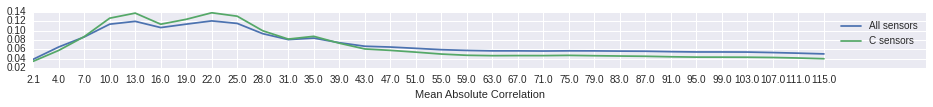

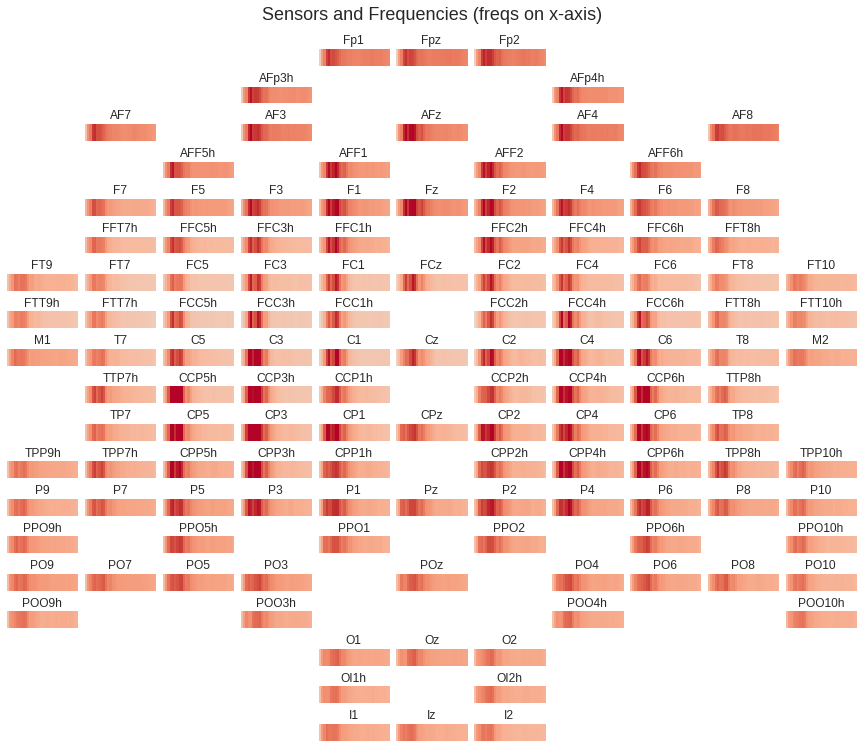

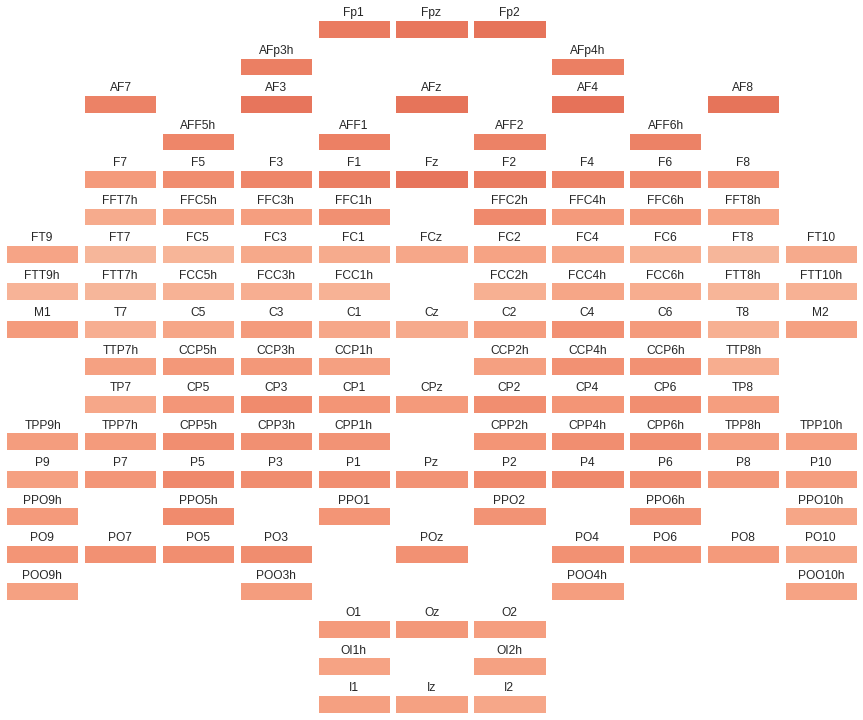

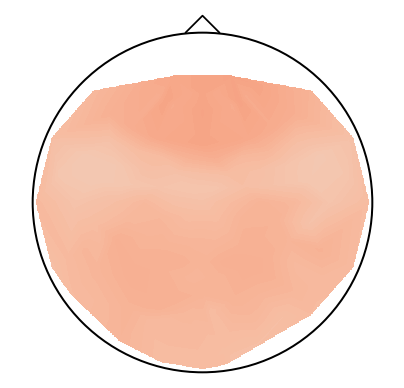

In [68]:
meaned_rand_corrs = np.mean(np.abs(rand_corrs_per_person[clean_mask]), axis=(0,3))
show_freq_profile(meaned_abs_corrs - meaned_rand_corrs)
show_sensor_topo(meaned_abs_corrs - meaned_rand_corrs)


In [5]:
from braindecode.experiments.load import load_model
from braindecode.veganlasagne.layer_util import print_layers

model = load_model('data/models/paper/ours/cnt/shallow/car/2')



INFO:braindecode.experiments.experiment:Setting n_sample preds automatically to 467
INFO:braindecode.experiments.experiment:Input window length is 534


In [418]:
#plot_all_persons(topo_corrs_per_person[:20], rand_corrs_per_person[:20], result_pool.result_objects()[:20])